# 使用ORB算法实现人脸特征提取和识别

ORB算法的全称是基于定向FAST和旋转BRIEF(Oriented FAST and Rotated BRIEF). 其中FAST用于提取关键点, rBRIEF算法用于从关键点中提取特征向量. 利用这种算法可以实现对一些相对固定的特征的提取和识别. 例如人脸(一张人脸的眼睛, 耳朵基本上是固定的), 或汽车等.

ORB算法不仅可以识别出图像中的特定对象, 还可以返回对象的位置, 并且ORB算法非常高效, 可用于视频流的实时分析. 下面我们来感受一下ORB算法.

## ORB 算法简介



### 加载图像并导入资源

在下面的代码中,我们将使用OpenCV来加载一张女性人脸的图像,用作我们的训练图像.在这里,`cv2.imread()`函数会将图像加载为BGR,我们要把该图像转换为RGB,因此我们可以使用正确的颜色显示它. 另外, 颜色信息对于我们来说并不重要, 因此我们将BGR图像转换为灰度图像进行分析.

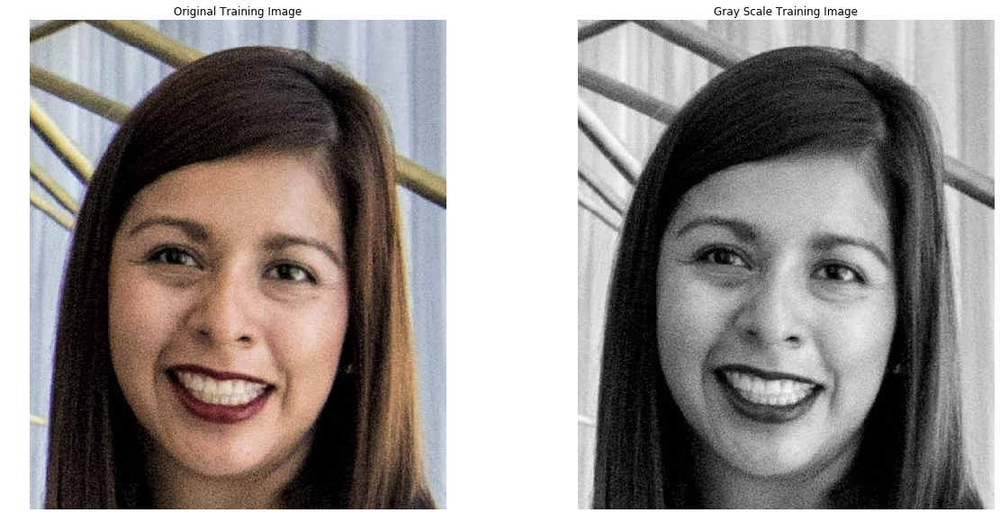

In [3]:
%matplotlib inline

import cv2
import matplotlib.pyplot as plt

# 设置plot的默认尺寸
plt.rcParams['figure.figsize'] = [20,10]

# 训练图像
image = cv2.imread('images/face.jpeg')

# 将训练图像转换为RGB和灰度图像
training_image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
training_gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

# 展示图像
plt.subplot(121)
plt.title('Original Training Image')
plt.axis('off')
plt.imshow(training_image)
plt.subplot(122)
plt.title('Gray Scale Training Image')
plt.axis('off')
plt.imshow(training_gray, cmap = 'gray')
plt.show()

## 定位关键点

ORB算法的第一步是定位训练图像中的所有关键点.找到关键点后,ORB会创建相应的二进制特征向量,并在ORB描述子中将它们组合在一起。

我们要使用OpenCV的`ORB`类来定位关键点并创建相应的ORB描述子.另外,要使用`ORB_create()`函数设置ORB算法的参数.`ORB_create()`函数的参数及其默认值如下:


`cv2.ORB_create(nfeatures = 500,
               scaleFactor = 1.2,
    	       nlevels = 8,
    	       edgeThreshold = 31,
    	       firstLevel = 0,
    	       WTA_K = 2,
    	       scoreType = HARRIS_SCORE,
    	       patchSize = 31,
    	       fastThreshold = 20)`

参数：

* **nfeatures** - *int*  
  确定想要定位的特征（即关键点）的最大数量。


* **scaleFactor** - *float*  
  金字塔抽取比率必须大于1。ORB会使用图像金字塔来查找特征，因此必须提供金字塔中每个层与金字塔所具有的级别数之间的比例因子。 `scaleFactor = 2`表示经典金字塔，其中每个下一级别的像素比前一级少4倍。大比例因子将会减少检测到的特征数量。


* **nlevels** - *int*  
  金字塔等级的数量。最小级别的线性大小等于input_image_linear_size / pow（scaleFactor，nlevels）。


* **edgeThreshold** - - *int*  
  未检测到特征的边缘大小。由于关键点具有特定的像素大小，因此必须从搜索中排除图像的边缘。 `edgeThreshold`的大小应等于或大于patchSize参数。


* **firstLevel** - *int*  
  此参数用于确定应将哪个级别当做金字塔中的第一级别。它在当前实现中应为0。通常情况下，具有统一标度的金字塔等级被认为是第一级。


* **WTA_K** - *int*  
  用于生成定向BRIEF描述子的每个元素的随机像素的数量。可能的值为2、3和4，其中2为默认值。例如，值3意味着一次选择三个随机像素来比较它们的亮度，并返回最亮像素的索引。由于有3个像素，因此返回的索引将为0、1或2。


* **scoreType** - *int*  
  此参数可以设置为HARRIS_SCORE或FAST_SCORE。默认的HARRIS_SCORE表示Harris角点算法用于对特征进行排名。该分数仅用于保留最佳特征。 FAST_SCORE生成的关键点稳定性稍差，但计算起来要快一些。


* **patchSize** - *int*  
  定向BRIEF描述子使用的补丁的大小。在较小的金字塔层级上，由特征覆盖的感知图像区域将更大。


我们可以看到,`cv2. ORB_create()`函数支持各种参数.前两个参数（`nfeatures` and ` scaleFactor`）最有可能需要更改.其他参数只要保留其默认值,就可以获得不错的结果.

在下面的代码中,我们将使用`ORB_create()`函数将我们想要检测的关键点的最大数量设置为200, 并将金字塔抽取比率设置为2.1.然后，使用` .detectAndCompute (image)`方法定位给定训练`image`中的关键点并计算其对应的ORB描述子.最后, 使用` cv2.drawKeypoints()`函数把ORB算法找到的关键点可视化.

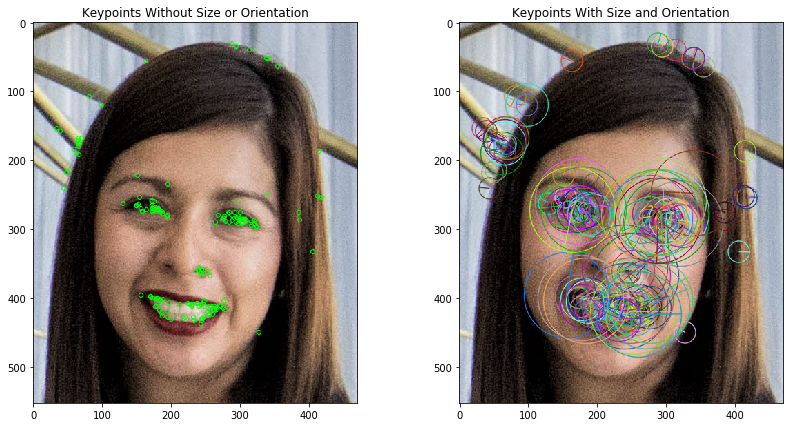


Number of keypoints Detected:  175


In [5]:
import numpy as np

plt.rcParams['figure.figsize'] = [14.0, 7.0]

# 设置ORB的参数, 详情见上方的文档
orb = cv2.ORB_create(200, 2.0)

# 在原始灰度图像中寻找关键点, 并创建描述子
# None参数表示我们没有使用Mask
keypoints, descriptor = orb.detectAndCompute(training_gray, None)

# 复制图像, 以展示关键点
keyp_without_size = np.copy(training_image)
keyp_with_size = np.copy(training_image)

# 绘制关键点, 这里的绘制不会显示关键点的大小
cv2.drawKeypoints(training_image, keypoints, keyp_without_size, color = (0, 255, 0))

# 这里的绘制会显示关键点的范围
cv2.drawKeypoints(training_image, keypoints, keyp_with_size, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.subplot(121)
plt.title('Keypoints Without Size or Orientation')
plt.imshow(keyp_without_size)

plt.subplot(122)
plt.title('Keypoints With Size and Orientation')
plt.imshow(keyp_with_size)
plt.show()

print("\nNumber of keypoints Detected: ", len(keypoints))

如右边的图所示,每个关键点都有一个中心、一个大小和一个角度,这个中心会确定图像中每个关键点的位置,每个关键点的大小由BRIEF用来创建其特征向量的补丁大小决定,而角度会告诉我们由rBRIEF确定的关键点的方向.

找到训练图像的关键点并且计算了它们相应的ORB描述子之后,就可以对查询图像进行相同的操作.为了更清楚地查看ORB算法的属性,在下一部分中,我们将使用与我们的训练和查询图像相同的图像.

## 特征匹配

获得了训练和查询图像的ORB描述子之后，最后一步就是使用相应的ORB描述子在两个图像之间进行关键点匹配。这种*匹配*通常由匹配函数执行。最常用的匹配函数是*Brute-Force*。

在下面的代码中，我们将使用OpenCV的`BFMatcher `类来比较训练和查询图像中的关键点。使用`cv2.BFMatcher()`函数设置Brute-Force匹配程序的参数。 `cv2.BFMatcher()`函数的参数及其默认值如下：



`cv2.BFMatcher(normType = cv2.NORM_L2,
		 	  crossCheck = false)`

参数：

* **normType**  
  确定用于确定匹配质量的度量标准。默认情况下，`normType = cv2.NORM_L2`，它用于测量两个描述子之间的距离。但是，对于像ORB创建的二进制描述子一样，汉明度量更合适。汉明度量通过计算二进制描述子之间的不相似位的数量来确定距离。当使用`WTA_K = 2`创建ORB描述子时，要选择两个随机像素并在亮度上进行比较。最亮像素的索引返回为0或1。此类输出仅占用1位，因此应使用` cv2.NORM_HAMMING` 度量。另一方面，如果使用`WTA_K = 3`创建ORB描述子，则选择三个随机像素并在亮度上进行比较。最亮像素的索引返回0、1或2。这样的输出将占用2位，因此应该使用汉明距离的特殊变体，即`cv2.NORM_HAMMING2`（2代表2位）。然后，对于所选择的任何度量，当比较训练和查询图像中的关键点时，具有较小度量（它们之间的距离）的对被认为是最佳匹配。


* **crossCheck** - *bool* 
  布尔变量，可以设置为`True` 或 `False`。交叉验证对于消除错误匹配非常有用。交叉验证通过执行两次匹配过程来完成。第一次匹配中，将训练图像中的关键点与查询图像中的关键点进行比较；第二次匹配中，将查询图像中的关键点与训练图像中的关键点进行比较（*即*，反向进行比较）。启用交叉验证时，只有当训练图像中的关键点*A*是查询图像中关键点*B*的最佳匹配时，该匹配才被视为有效，反之亦然（即，如果查询图像中的关键点*B* 是训练图像中的关键点*A*，该匹配则是最佳匹配）。

设置了BFMatcher的参数之后，我们就可以使用`.match(descriptors_train, descriptors_query)`方法，使用它们的ORB描述子找到训练和查询图像之间的匹配关键点。最后，我们将使用` cv2.drawMatches ()`函数来可视化Brute-Force匹配程序找到的匹配关键点。此函数会水平堆叠训练和查询图像，并将训练图像中关键点的线条绘制到查询图像中对应的最佳匹配关键点。在这里，请注意，为了更清楚地查看ORB算法的属性，在以下示例中，我们将使用与我们的训练和查询图像相同的图像。

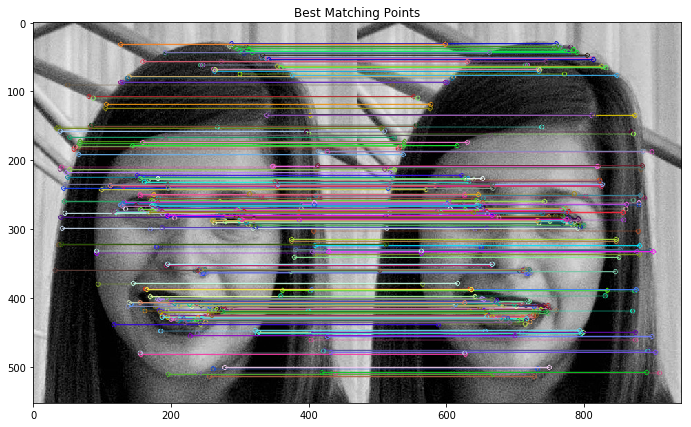

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  821

Number of Matching Keypoints Between The Training and Query Images:  821


In [8]:
# ---------------- 下面的代码是训练和查询的完整过程 -------------------

import cv2
import matplotlib.pyplot as plt

def orb_show(train_image, query_image):

    plt.rcParams['figure.figsize'] = [14.0, 7.0]

    # 加载训练图像
    image1 = cv2.imread(train_image)

    # 加载查询图像, 这里, 和训练图像保持一致
    image2 = cv2.imread(query_image)

    training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
    query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

    training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
    query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

    # 创建ORB参数
    orb = cv2.ORB_create(1000, 2.0)

    # 创建训练和查询的ORB关键点和描述子
    keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
    keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

    # 创建一个BFMatcher对象.将crossCheck设为True, 让BFMatcher只返回一致的对.
    # 当有足够的匹配时, 这样的技术通常产生最好的, 拥有最少异常值的结果
    bf = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck = True)

    # 执行训练图像和查询图像的ORB描述子之间的匹配
    matches = bf.match(descriptors_train, descriptors_query)

    # 我们需要更短的匹配距离, 因此按照距离对匹配进行排序
    matches = sorted(matches, key = lambda x : x.distance)

    # 将训练图像中的关键点和查询图像中最匹配的关键点连接起来
    # 最佳的匹配对应于排好序的匹配列表中的第一个元素, 因为它们是有更短距离的匹配.
    # 我们绘制前300个匹配并使用 flags = 2 去绘制没有大小或方向的匹配的关键点
    result = cv2.drawMatches(training_gray, keypoints_train, query_gray, keypoints_query, matches[:300], query_gray, flags = 2)

    # Display the best matching points
    plt.title('Best Matching Points')
    plt.imshow(result)
    plt.show()

    # Print the number of keypoints detected in the training image
    print("Number of Keypoints Detected In The Training Image: ", len(keypoints_train))

    # Print the number of keypoints detected in the query image
    print("Number of Keypoints Detected In The Query Image: ", len(keypoints_query))

    # Print total number of matching points between the training and query images
    print("\nNumber of Matching Keypoints Between The Training and Query Images: ", len(matches))
    
    
orb_show('images/face.jpeg', 'images/face.jpeg')

在上面的示例中,由于训练图像和查询图像完全相同,因此,我们希望在两个图像中找到相同数量的关键点,并且所有关键点都匹配.我们可以清楚地看到,事实确实如此,ORB在两个图像中都找到了相同数量的关键点,而且Brute-Force匹配程序能够正确匹配训练和查询图像中的所有关键点.

## ORB的主要属性

我们现在将依次了解ORB算法的几大主要属性：

* 尺度不变性
* 旋转不变性
* 光照不变性
* 抗噪性

同样，为了更清楚地看到ORB算法的属性，在下面的示例中，我们将使用与我们的训练和查询图像相同的图像。


### 尺度不变性

 ORB算法具有尺度不变性。这意味着无论图像大小如何，它能够检测图像中的对象。为了看清楚这一点，我们现在将使用Brute-Force匹配程序来匹配训练图像和一张查询图像种的点，其中，该查询图像的尺寸是原始训练图像的1/4。

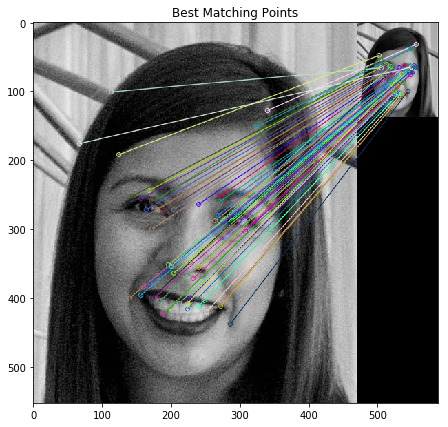

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  65

Number of Matching Keypoints Between The Training and Query Images:  60


In [10]:
orb_show('images/face.jpeg', 'images/faceQS.png')

在上面的示例中，请注意训练图像是553 x 471像素，而查询图像是138 x 117像素，是原始训练图像大小的1/4。另外，需要注意的是，查询图像中检测到的关键点数量仅为65，远小于训练图像中的831个关键点。然而，我们可以看到，Brute-Force匹配程序可以将查询图像中的大多数关键点与训练图像中的相应关键点进行匹配。

### 旋转不变性

ORB算法也具有旋转不变性。这意味着无论方向如何，它都能够检测到图像中的对象。为了看清楚这一点，我们要使用Brute-Force匹配程序来匹配训练图像和旋转了90度的查询图像中的点。

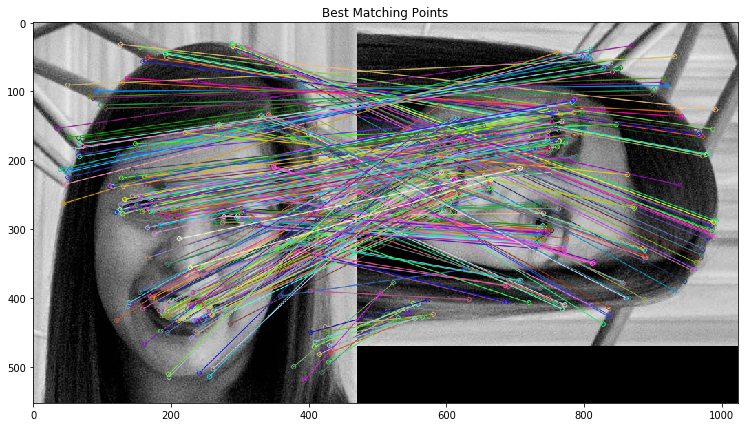

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  832

Number of Matching Keypoints Between The Training and Query Images:  649


In [12]:
orb_show('images/face.jpeg', 'images/faceR.jpeg')

在上面的例子中，我们看到在两个图像中检测到的关键点的数量非常相似，即使查询图像被旋转了，Brute-Force匹配程序仍然可以对检测到的约78%的关键点进行匹配。此外，请注意大多数匹配关键点都接近特定的人脸特征，例如眼睛、鼻子与嘴巴。

### 光照不变性

ORB算法也具有光照不变性。这意味着无论光照如何，它都能够检测到图像中的物体。为了看清楚这一点，我们现在将使用Brute-Force匹配程序来匹配训练图像与亮度更亮的查询图像中的点。

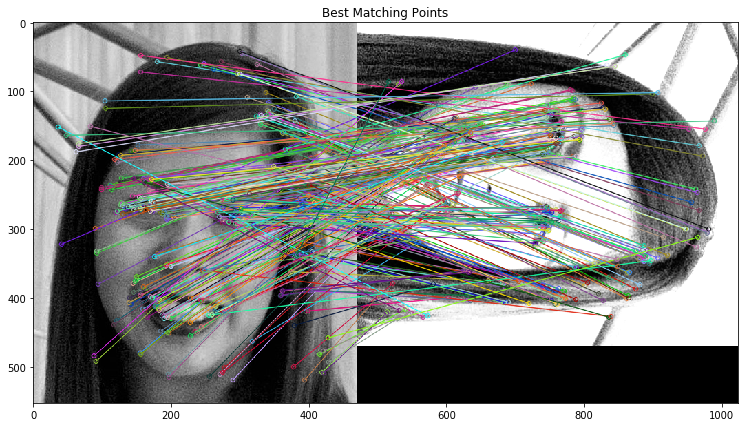

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  846

Number of Matching Keypoints Between The Training and Query Images:  509


In [13]:
orb_show('images/face.jpeg', 'images/faceRI.png')

在上面的例子中，我们看到在两个图像中检测到的关键点的数量依然非常相似，即使查询图像的亮度更亮，Brute-Force匹配程序仍然可以对检测到的约63％的关键点进行匹配。

### 抗噪性

ORB算法也具有抗噪性。这意味着即使图像具有一定程度的噪声，它也能够检测到图像中的对象。为了看清楚这一点，我们现在将使用Brute-Force匹配程序来匹配训练图像和具有大量噪声的查询图像中的点。

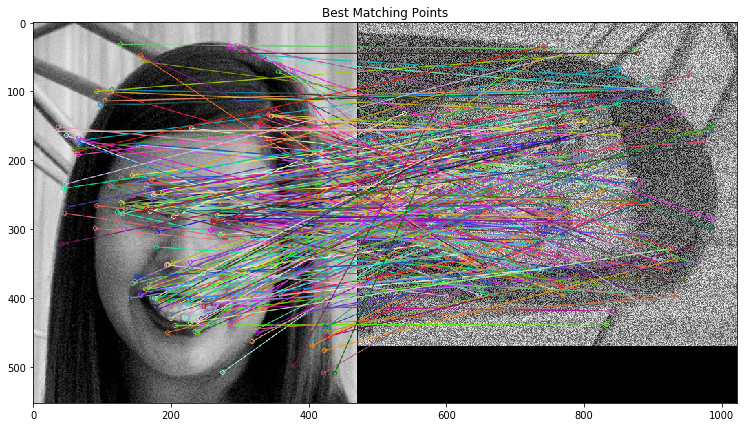

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  878

Number of Matching Keypoints Between The Training and Query Images:  492


In [14]:
orb_show('images/face.jpeg', 'images/faceRN5.png')

在上面的例子中，我们同样看到了两个图像中检测到的关键点的数量非常相似，即使查询图像有很多噪声，Brute-Force匹配程序仍然可以对检测到的大约63％的关键点进行匹配。此外，请注意，大多数匹配关键点都接近特定的人脸特征，例如眼睛、鼻子与嘴巴。此外，我们可以看到有一些特征不太匹配，这可能是因为图像区域中的强度模式相似而被选中。另外，还要说明的一点是，在这个示例中，我们使用的金字塔抽取比率为1.3，而不是前面示例中使用的值2.0，因为在这个特殊的例子中，这个比率会产生更好的结果。

## 人脸提取

我们现在将运用ORB算法，实现在另一图像中检测训练图像中的人脸。与之前一样，首先需要加载训练和查询图像。

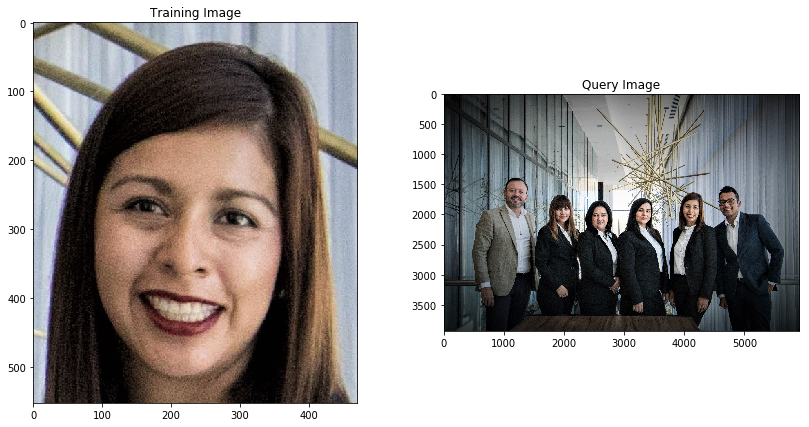

In [15]:
plt.rcParams['figure.figsize'] = [14.0, 7.0]

image1 = cv2.imread('./images/face.jpeg')
image2 = cv2.imread('./images/Team.jpeg')

training_image = cv2.cvtColor(image1, cv2.COLOR_BGR2RGB)
query_image = cv2.cvtColor(image2, cv2.COLOR_BGR2RGB)

plt.subplot(121)
plt.imshow(training_image)
plt.title('Training Image')
plt.subplot(122)
plt.imshow(query_image)
plt.title('Query Image')
plt.show()

在这个特定的例子中，训练图像中包含一个人脸，因此，于我们之前所见相同，检测到的大多数关键点都接近人脸特征，例如眼睛、鼻子与嘴巴。另一方面，我们的查询图像是一组人的图片，其中一个是我们想要检测的女人。接下来要做的是，检测查询图像的关键点。

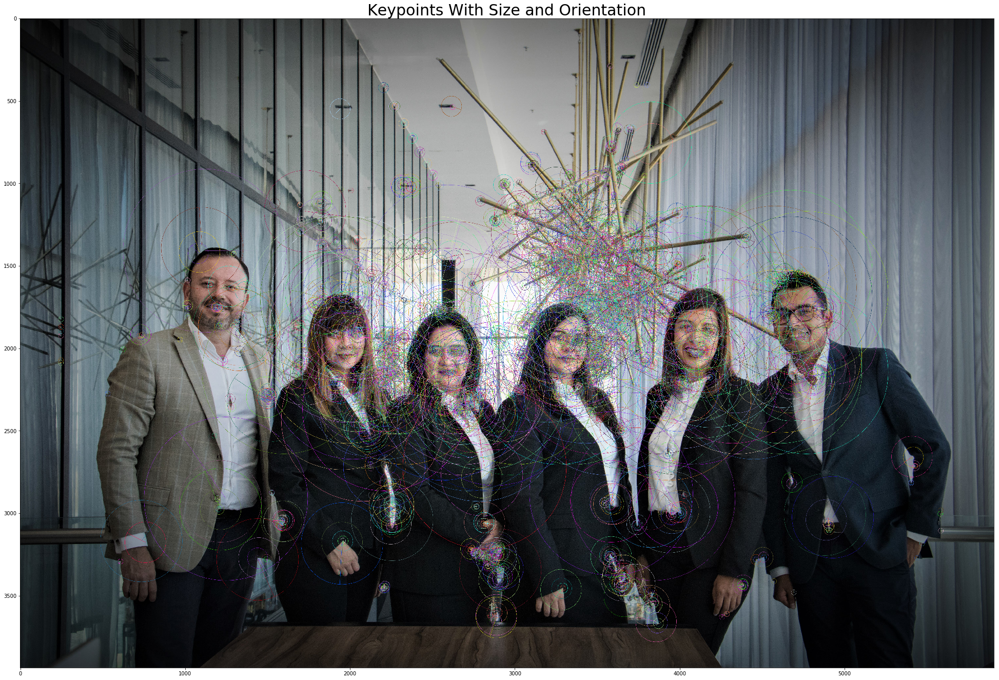


Number of keypoints Detected:  4941


In [19]:
plt.rcParams['figure.figsize'] = [34.0, 34.0]

training_gray = cv2.cvtColor(training_image, cv2.COLOR_BGR2GRAY)
query_gray = cv2.cvtColor(query_image, cv2.COLOR_BGR2GRAY)

orb = cv2.ORB_create(5000, 2.0)

keypoints_train, descriptors_train = orb.detectAndCompute(training_gray, None)
keypoints_query, descriptors_query = orb.detectAndCompute(query_gray, None)

query_img_keyp = np.copy(query_image)

cv2.drawKeypoints(query_image, keypoints_query, query_img_keyp, flags = cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

plt.title('Keypoints With Size and Orientation', fontsize = 30)
plt.imshow(query_img_keyp)
plt.show()

print("\nNumber of keypoints Detected: ", len(keypoints_query))

我们可以看到，该查询图像在图像的许多部分都有关键点。现在，已经获得了训练图像和查询图像的关键点与ORB描述子，接下来，就可以使用Brute-Force匹配程序来尝试在查询图像中寻找这位女性的脸部。

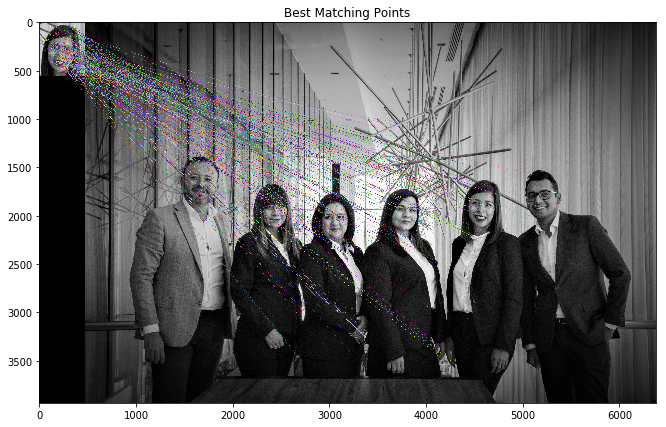

Number of Keypoints Detected In The Training Image:  821
Number of Keypoints Detected In The Query Image:  988

Number of Matching Keypoints Between The Training and Query Images:  433


In [20]:
orb_show('images/face.jpeg', 'images/Team.jpeg')

我们可以清楚地看到，即使查询图像中有许多人脸和对象，Brute-Force匹配程序也能够在查询图像中正确地定位到该女性的脸部。